In [1]:
import pandas as pd
import numpy as np
import kagglehub 
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
from matplotlib.ticker import StrMethodFormatter
from matplotlib.ticker import FuncFormatter

C:\Users\mrsmo\anaconda3\envs\pandas_playground\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
path = kagglehub.dataset_download("omniamahmoudsaeed/real-estate-sales-2001-2022")

In [3]:
import os
print(os.listdir(path))

['Real_Estate_Sales_2001-2022_GL.csv']


In [4]:
pd.set_option("display.max_rows", None)

In [5]:
file_path = r"C:\Users\mrsmo\.cache\kagglehub\datasets\omniamahmoudsaeed\real-estate-sales-2001-2022\versions\1\Real_Estate_Sales_2001-2022_GL.csv"
df = pd.read_csv(file_path, parse_dates=["Date Recorded"], low_memory=False)

df["List Year"] = df["List Year"].astype("category")
df["Property Type"] = df["Property Type"].astype("category")
df["Residential Type"] = df["Residential Type"].astype("category")
df["Town"] = df["Town"].astype("category")

df.head()

,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
0,2020177,2020,2021-04-14,Ansonia,323 BEAVER ST,133000.0,248400.0,0.5354,Residential,Single Family,NaN,NaN,NaN,POINT (-73.06822 41.35014)
1,2020225,2020,2021-05-26,Ansonia,152 JACKSON ST,110500.0,239900.0,0.4606,Residential,Three Family,NaN,NaN,NaN,NaN
2,2020348,2020,2021-09-13,Ansonia,230 WAKELEE AVE,150500.0,325000.0,0.4630,Commercial,NaN,NaN,NaN,NaN,NaN
3,2020090,2020,2020-12-14,Ansonia,57 PLATT ST,127400.0,202500.0,0.6291,Residential,Two Family,NaN,NaN,NaN,NaN
4,210288,2021,2022-06-20,Avon,12 BYRON DRIVE,179990.0,362500.0,0.4965,Residential,Condo,NaN,NaN,NaN,POINT (-72.879115982 41.773452988)


In [6]:
pd.set_option('display.float_format', '{:,.0f}'.format)

In [7]:
df["Sale Amount"].isna().sum()

np.int64(0)

In [8]:
years = df.groupby("List Year", observed=True)
years.head()

,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
0,2020177,2020,2021-04-14,Ansonia,323 BEAVER ST,"133,000","248,400",1,Residential,Single Family,NaN,NaN,NaN,POINT (-73.06822 41.35014)
1,2020225,2020,2021-05-26,Ansonia,152 JACKSON ST,"110,500","239,900",0,Residential,Three Family,NaN,NaN,NaN,NaN
2,2020348,2020,2021-09-13,Ansonia,230 WAKELEE AVE,"150,500","325,000",0,Commercial,NaN,NaN,NaN,NaN,NaN
3,2020090,2020,2020-12-14,Ansonia,57 PLATT ST,"127,400","202,500",1,Residential,Two Family,NaN,NaN,NaN,NaN
4,210288,2021,2022-06-20,Avon,12 BYRON DRIVE,"179,990","362,500",0,Residential,Condo,NaN,NaN,NaN,POINT (-72.879115982 41.773452988)
5,200500,2020,2021-09-07,Avon,245 NEW ROAD,"217,640","400,000",1,Residential,Single Family,NaN,NaN,NaN,NaN
24,211386,2021,2022-04-18,Bridgeport,55 CANNON ST,"110,610","50,000",2,Vacant Land,NaN,NaN,NaN,NaN,POINT (-73.19020596 41.178257983)
31,212036,2021,2022-08-08,Bridgeport,540 JAMES ST,"252,150","650,000",0,Commercial,NaN,NaN,NaN,NaN,POINT (-73.204413035 41.183766989)
32,212150,2021,2022-08-30,Bridgeport,126 KENNEDY DR,"70,850","130,000",1,Residential,Condo,NaN,NaN,NaN,POINT (-73.221583028 41.214441988)
39,211190,2021,2022-08-08,Bristol,477 PERKINS ST,"45,010","99,900",0,Vacant Land,NaN,NaN,NaN,NaN,POINT (-72.966378188 41.695721379)


In [9]:
#Total Sales Amount by Year
sales_by_year_df = df.groupby("List Year", observed=True)["Sale Amount"].sum().reset_index()
sales_by_year_df

,List Year,Sale Amount
0,2001,"14,671,668,335"
1,2002,"17,687,185,857"
2,2003,"21,020,152,793"
3,2004,"31,966,245,823"
4,2005,"22,424,983,827"
5,2006,"23,191,375,510"
6,2007,"15,518,803,446"
7,2008,"10,666,103,724"
8,2009,"15,100,980,907"
9,2010,"11,107,540,414"


In [10]:
sales_by_year_df.to_csv("total_yearly_sales.csv")

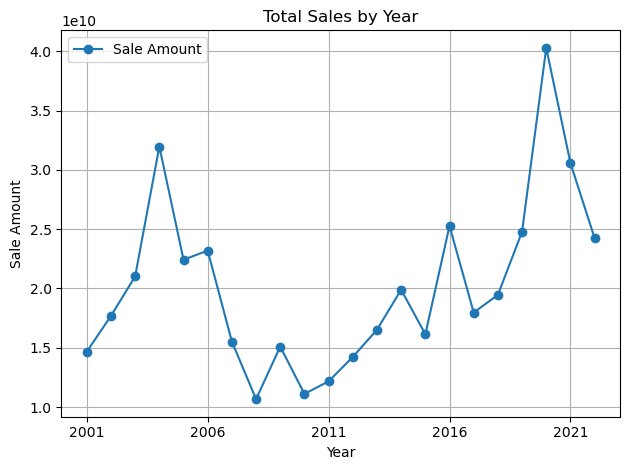

In [11]:
sales_by_year_df.plot(x="List Year", y="Sale Amount", kind="line", marker='o', title="Total Sales by Year")
plt.ylabel("Sale Amount")
plt.xlabel("Year")
plt.grid(True)
plt.tight_layout()
plt.show()

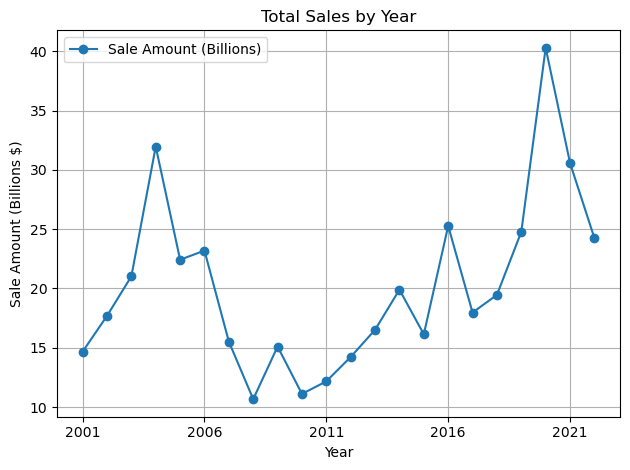

In [12]:
# Create a billions version of the column
sales_by_year_df["Sale Amount (Billions)"] = sales_by_year_df["Sale Amount"] / 1e9

# Plot
ax = sales_by_year_df.plot(
    x="List Year",
    y="Sale Amount (Billions)",
    kind="line",
    marker='o',
    title="Total Sales by Year"
)

ax.set_ylabel("Sale Amount (Billions $)")
ax.set_xlabel("Year")
ax.grid(True)

plt.tight_layout()
plt.show()


In [13]:
years_town = df.groupby(["List Year", "Town"], observed=True)
years_town.head()

,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
0,2020177,2020,2021-04-14,Ansonia,323 BEAVER ST,"133,000","248,400",1,Residential,Single Family,NaN,NaN,NaN,POINT (-73.06822 41.35014)
1,2020225,2020,2021-05-26,Ansonia,152 JACKSON ST,"110,500","239,900",0,Residential,Three Family,NaN,NaN,NaN,NaN
2,2020348,2020,2021-09-13,Ansonia,230 WAKELEE AVE,"150,500","325,000",0,Commercial,NaN,NaN,NaN,NaN,NaN
3,2020090,2020,2020-12-14,Ansonia,57 PLATT ST,"127,400","202,500",1,Residential,Two Family,NaN,NaN,NaN,NaN
4,210288,2021,2022-06-20,Avon,12 BYRON DRIVE,"179,990","362,500",0,Residential,Condo,NaN,NaN,NaN,POINT (-72.879115982 41.773452988)
5,200500,2020,2021-09-07,Avon,245 NEW ROAD,"217,640","400,000",1,Residential,Single Family,NaN,NaN,NaN,NaN
6,200121,2020,2020-12-15,Avon,63 NORTHGATE,"528,490","775,000",1,Residential,Single Family,NaN,NaN,NaN,POINT (-72.89675 41.79445)
7,20058,2020,2021-06-01,Barkhamsted,46 RATLUM MTN RD,"203,530","415,000",0,Residential,Single Family,NaN,"2003 COLONIAL, 2140 SFLA, 2.99 AC",NaN,NaN
8,200046,2020,2021-01-25,Beacon Falls,34 LASKY ROAD,"158,030","243,000",1,Residential,Single Family,NaN,NaN,NaN,NaN
9,200016,2020,2020-11-13,Beacon Falls,9 AVON COURT,"65,590","100,000",1,Residential,Condo,NaN,NaN,NaN,NaN


In [14]:
#leaving observed=False with categorical data was causing zeros

years_town_sum = df.groupby(["List Year", "Town"], observed=True)["Sale Amount"].sum()
years_town_sum

List Year  Town            
2001       Ansonia               60,055,884
           Ashford               19,308,827
           Avon                 199,770,409
           Barkhamsted           14,613,518
           Berlin                91,141,367
           Bethany               34,368,535
           Bethel               123,763,391
           Bethlehem             15,504,110
           Bloomfield           110,735,071
           Bolton                19,024,492
           Bozrah                 3,697,486
           Branford             166,498,852
           Bridgeport           393,362,184
           Bridgewater           17,943,859
           Bristol              216,517,064
           Brooklyn              23,402,400
           Burlington            48,084,571
           Canaan                 4,945,397
           Canterbury            13,927,711
           Canton                61,534,026
           Chaplin                5,951,473
           Cheshire             150,926,828
    

In [15]:
years_town_sum.shape

(3066,)

In [16]:
years_town_sum.to_csv("years_town_sum.csv")

In [17]:
print(os.getcwd())

C:\Users\mrsmo\Real Estate Sales Project


In [18]:
#Example of taking yearly sales by specific town

avon_df = df[df["Town"] == "Avon"]
avon_yearly_sales = (
    avon_df.groupby("List Year", observed=True)["Sale Amount"]
    .sum()
    .reset_index()
    .rename(columns={"Sale Amount": "Total Sales"})
    
           )

avon_yearly_sales

,List Year,Total Sales
0,2001,"199,770,409"
1,2002,"260,560,436"
2,2004,"307,256,219"
3,2005,"242,701,535"
4,2006,"225,639,681"
5,2007,"164,815,682"
6,2008,"19,469,986"
7,2009,"132,514,608"
8,2010,"159,351,401"
9,2011,"161,990,921"


In [19]:
# Ensure index is integer (or sorted categorical)
avon_yearly_sales.index = avon_yearly_sales.index.astype(int)


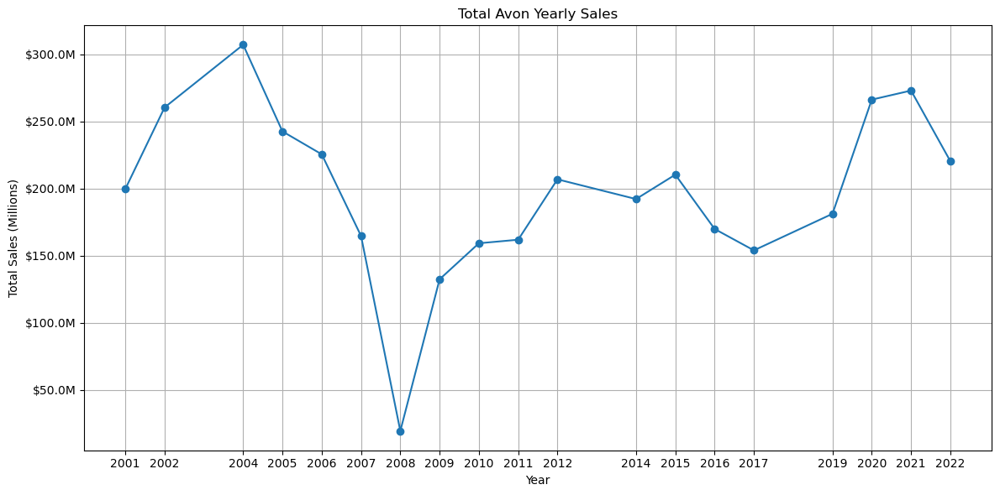

In [21]:

# Filter to Avon and sum yearly sales
avon_df = df[df["Town"] == "Avon"]
avon_yearly_sales = (
    avon_df.groupby("List Year", observed=True)["Sale Amount"]
    .sum()
    .reset_index()
    .rename(columns={"Sale Amount": "Total Sales"})
)

# Convert to millions
avon_yearly_sales["Total Sales (Millions)"] = avon_yearly_sales["Total Sales"] / 1e6

# Create the plot
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(
    avon_yearly_sales["List Year"],
    avon_yearly_sales["Total Sales (Millions)"],
    marker='o'
)

# Labels & title
ax.set_title("Total Avon Yearly Sales")
ax.set_xlabel("Year")
ax.set_ylabel("Total Sales (Millions)")

# Format y-axis to millions with 1 decimal
ax.yaxis.set_major_formatter(StrMethodFormatter('${x:,.1f}M'))

# Ensure every year appears on x-axis
ax.set_xticks(avon_yearly_sales["List Year"])

# Grid and layout
ax.grid(True)
plt.tight_layout()
plt.show()
